# Sensitivity Analysis

In [1]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy
from scipy import signal
from sklearn.decomposition import PCA
import seaborn as sns
from scipy import stats
import oceans.sw_extras as sw
import pickle
import hvplot.xarray
from ni_tools import inversion

%matplotlib inline
%config InlineBackend.figure_format = 'svg'

### compute / plot principal components

In [2]:
fn = '/datadrive/HYCOM_data/Axial_Seamount_earthengine/*.nc'
HYCOM = xr.open_mfdataset(fn).sel({'depth':slice(0,1500)}).interp({'depth':np.arange(0,1500)})

In [3]:
avg_temp = HYCOM.temperature.mean('depth')
avg_sal = HYCOM.salinity.mean('depth')

temp_pca = PCA(n_components=3).fit(HYCOM.temperature - avg_temp)
sal_pca = PCA(n_components=3).fit(HYCOM.salinity - avg_sal)

temp_comps = temp_pca.components_
sal_comps = sal_pca.components_

In [4]:
np.expand_dims(temp_pca.mean_, 1).shape

(1500, 1)

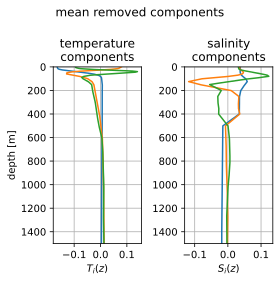

In [6]:
fig = plt.figure(figsize=(4,4))
fig.suptitle('mean removed components')

plt.subplot(1,2,1)
plt.plot(temp_pca.components_.T, HYCOM.depth)
plt.ylim([1500,0])
plt.grid()
plt.title('temperature\ncomponents')
plt.xlabel('$T_i(z)$')
plt.ylabel('depth [m]')

plt.subplot(1,2,2)
plt.plot(sal_pca.components_.T, HYCOM.depth)
plt.ylim([1500,0])
plt.grid()

plt.xlabel('$S_i(z)$')
plt.title('salinity\ncomponents')

plt.tight_layout()

## Exploration

### reconstruct profile (and create plots)

In [8]:
temp_coefs = temp_pca.transform(HYCOM.temperature - HYCOM.temperature.mean('depth'))
T0 = temp_pca.mean_

sal_coefs = sal_pca.transform(HYCOM.salinity - HYCOM.salinity.mean('depth'))
S0 = sal_pca.mean_

In [65]:
T2_coefs

array([[13.52162794, 13.08984434,  0.        ]])

2015-03-03T00:00:00.000000000
2015-09-11T00:00:00.000000000


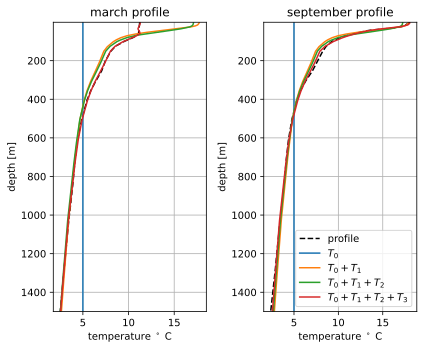

In [110]:
T1_coefs = temp_coefs[k:k+1,:].copy()
T1_coefs[0][1:] = 0
T2_coefs = temp_coefs[k:k+1,:].copy()
T2_coefs[0][2] = 0

avg_temp_prof = np.ones(1500)*avg_temp[k].values

fig = plt.figure(figsize=(6,5))

plt.subplot(1,2,1)
k = 60

print(HYCOM.time[k].values)
plt.plot(HYCOM['temperature'][k,:], HYCOM.depth, c='k',ls='--', label='profile')
plt.plot( avg_temp_prof,np.arange(1500), label='$T_0$')
plt.plot((T1_coefs @ temp_pca.components_).flatten() + T0 + avg_temp[k].values, np.arange(1500), label='$T_0 + T_1$')
plt.plot((T2_coefs @ temp_pca.components_).flatten() + T0 + avg_temp[k].values,np.arange(1500),  label='$T_0 + T_1 + T_2$')
plt.plot((temp_coefs[k:k+1,:] @ temp_pca.components_).flatten() + T0 + avg_temp[k].values, np.arange(1500), label='$T_0 + T_1 + T_2 + T_3$')

plt.ylim([1500, 1])


plt.grid()
plt.ylabel('depth [m]')
plt.xlabel('temperature $^\circ$ C')
plt.title('march profile')

plt.subplot(1,2,2)
k = 250

print(HYCOM.time[k].values)
plt.plot(HYCOM['temperature'][k,:], HYCOM.depth, c='k',ls='--', label='profile')
plt.plot( avg_temp_prof,np.arange(1500), label='$T_0$')
plt.plot((T1_coefs @ temp_pca.components_).flatten() + T0 + avg_temp[k].values, np.arange(1500), label='$T_0 + T_1$')
plt.plot((T2_coefs @ temp_pca.components_).flatten() + T0 + avg_temp[k].values,np.arange(1500),  label='$T_0 + T_1 + T_2$')
plt.plot((temp_coefs[k:k+1,:] @ temp_pca.components_).flatten() + T0 + avg_temp[k].values, np.arange(1500), label='$T_0 + T_1 + T_2 + T_3$')

plt.ylim([1500, 1])

plt.legend()
plt.grid()
plt.ylabel('depth [m]')
plt.xlabel('temperature $^\circ$ C')
plt.title('september profile')

plt.tight_layout()

In [132]:
np.histogram(

<xarray.DataArray 'salinity' (time: 14134)>
dask.array<mean_agg-aggregate, shape=(14134,), dtype=float64, chunksize=(2925,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 2015-01-01 2015-01-03 ... 2022-12-31T21:00:00

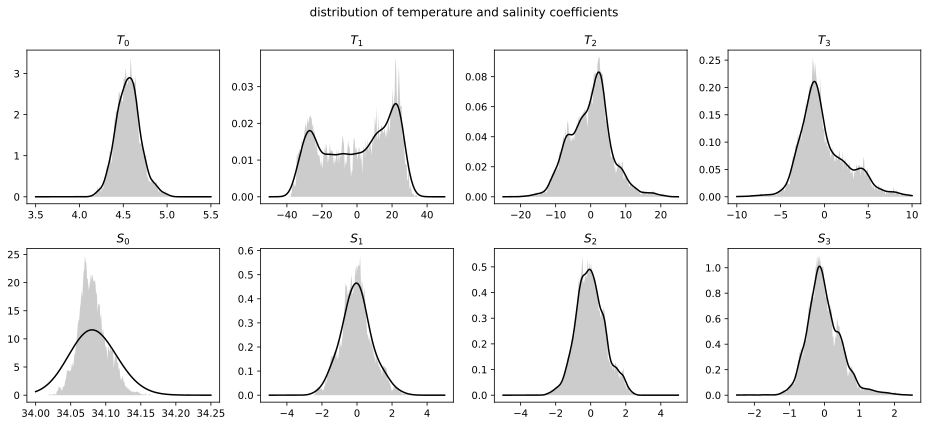

In [233]:
fig,axes = plt.subplots(2,4, figsize=(13,6))

fig.suptitle('distribution of temperature and salinity coefficients')

axes = axes.flatten()

plt.sca(axes[0])
H1,b = np.histogram(avg_temp, bins=np.linspace(3.5,5.5,250), density=True)
kernel = stats.gaussian_kde(avg_temp)
plt.plot(b, kernel(b), c='k')

plt.fill_between(b[:-1], H1, alpha=0.2, color='k', lw=0)
plt.title('$T_0$')
plt.xlabel('')

plt.sca(axes[1])

H2,b = np.histogram(temp_coefs[:,0], bins=np.linspace(-50,50,250), density=True)
kernel = stats.gaussian_kde(temp_coefs[:,0])
plt.plot(b, kernel(b), c='k')

plt.fill_between(b[:-1], H2, alpha=0.2, color='k', lw=0)
plt.title('$T_1$')
plt.xlabel('')

plt.sca(axes[2])
H3,b = np.histogram(temp_coefs[:,1], bins=np.linspace(-25,25,250), density=True)
kernel = stats.gaussian_kde(temp_coefs[:,1])
plt.plot(b, kernel(b), c='k')

plt.fill_between(b[:-1], H3, alpha=0.2, color='k', lw=0)
plt.title('$T_2$')
plt.xlabel('')

plt.sca(axes[3])
H4,b = np.histogram(temp_coefs[:,2], bins=np.linspace(-10,10,250), density=True)
kernel = stats.gaussian_kde(temp_coefs[:,2])
plt.plot(b, kernel(b), c='k')

plt.fill_between(b[:-1], H4, alpha=0.2, color='k', lw=0)
plt.title('$T_3$')
plt.xlabel('')

plt.sca(axes[4])

H5,b = np.histogram(avg_sal, bins=np.linspace(34,34.25,250), density=True)
kernel = stats.gaussian_kde(avg_sal)
plt.plot(b, kernel(b), c='k')

plt.fill_between(b[:-1], H5, alpha=0.2, color='k', lw=0)
plt.title('$S_0$')
plt.xlabel('')

plt.sca(axes[5])
H6,b = np.histogram(sal_coefs[:,0], bins=np.linspace(-5,5,250), density=True)
kernel = stats.gaussian_kde(sal_coefs[:,0])
plt.plot(b, kernel(b), c='k')

plt.fill_between(b[:-1], H6, alpha=0.2, color='k', lw=0)
plt.title('$S_1$')
plt.xlabel('')

plt.sca(axes[6])
H7,b = np.histogram(sal_coefs[:,1], bins=np.linspace(-5,5,250), density=True)
kernel = stats.gaussian_kde(sal_coefs[:,1])
plt.plot(b, kernel(b), c='k')

plt.fill_between(b[:-1], H7, alpha=0.2, color='k', lw=0)
plt.title('$S_2$')
plt.xlabel('')

plt.sca(axes[7])
H8,b = np.histogram(sal_coefs[:,2], bins=np.linspace(-2.5,2.5,250), density=True)
kernel = stats.gaussian_kde(sal_coefs[:,2])
plt.plot(b, kernel(b), c='k')

plt.fill_between(b[:-1], H8, alpha=0.2, color='k', lw=0)
plt.title('$S_3$')
plt.xlabel('')

plt.tight_layout()

### quasi Monte Carlo

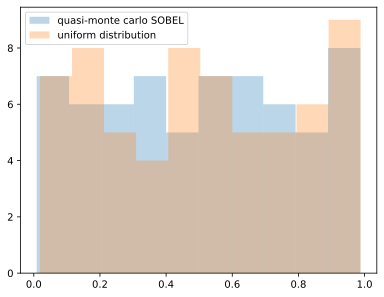

In [196]:
N = 64
x = stats.qmc.Sobol(1).random(N)
y = np.random.rand(N,1)

plt.hist(x, label='quasi-monte carlo SOBEL', alpha=0.3)
plt.hist(y, label='uniform distribution', alpha=0.3)
plt.legend()

cool

### distribution estimation - Trying for $T_1$

In [9]:
def inverse_transform(samples, pdf, x):
    '''
    inverse_transform. Given target pdf and samples, transform samples into distribution of pdf
    
    Parameters
    ----------
    samples : array like
    pdf : array like
    x : array like
        still need to understand what's going on here
        
    '''
    # Calculate the cumulative distribution function (CDF) from the PDF
    cdf = np.cumsum(pdf)
    
    # Normalize the CDF
    cdf /= cdf[-1]
    
    # Inverse transform the uniform samples to the estimated distribution
    transformed_samples = np.interp(samples, cdf, x)
    
    return transformed_samples

In [10]:
bins = np.arange(-50,50)
kernel = stats.gaussian_kde(temp_coefs[:,])
pdf = kernel(bins)

In [28]:
N = 512
samples = stats.qmc.Sobol(1).random(N)
samples_u = np.random.rand(N)

In [29]:
transformed_samples = inverse_transform(samples, pdf, bins)
transformed_samples_u = inverse_transform(samples_u, pdf, bins)

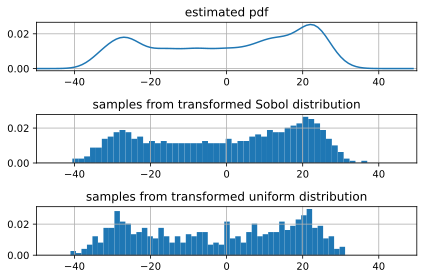

In [30]:
plt.subplot(3,1,1)
plt.title('estimated pdf')
plt.plot(bins, kernel(bins))
plt.xlim([-50,50])
plt.grid()

plt.subplot(3,1,2)
plt.title('samples from transformed Sobol distribution')
#plt.scatter(transformed_samples, np.zeros(len(transformed_samples)), s=50, alpha=1/N*100*0.18, lw=0)
plt.hist(transformed_samples, bins=50, density=True)
plt.xlim([-50,50])
plt.grid()
plt.tight_layout()

plt.subplot(3,1,3)
plt.title('samples from transformed uniform distribution')
#plt.scatter(transformed_samples_u, np.zeros(len(transformed_samples_u)), s=50, alpha=1/N*100*0.18, lw=0)
plt.hist(transformed_samples_u, bins=50, density=True)
plt.xlim([-50,50])
plt.grid()
plt.tight_layout()

- so I have all of the pieces, now I just need to create $8 \times 250$ (2000) ssps, and then run KRAKEN

### create independant samples for all 8 parameters

In [256]:
bins = np.arange(-50,50)
kernel = stats.gaussian_kde(temp_coefs[:,0])
pdf = kernel(bins)

In [352]:
N = 350
samples = stats.qmc.Sobol(1).random(N)

/tmp/ipykernel_1754/3688450056.py:2: UserWarning: The balance properties of Sobol' points require n to be a power of 2.
  samples = stats.qmc.Sobol(1).random(N)


In [353]:
transformed_samples = inverse_transform(samples, pdf, bins)

In [376]:
T1_samples = (transformed_samples @ temp_comps[:1,:])

In [386]:
T1_samples + T0

array([[ 3.89619801,  3.89285355,  3.88950908, ..., -2.01860112,
        -2.02030308, -2.02200503],
       [10.02874785, 10.02271153, 10.01667521, ..., -2.14728856,
        -2.14891581, -2.15054307],
       [12.0843178 , 12.0773792 , 12.0704406 , ..., -2.19042331,
        -2.19202553, -2.19362775],
       ...,
       [ 5.55246795,  5.54839647,  5.544325  , ..., -2.05335683,
        -2.05503861, -2.05672039],
       [ 7.13371223,  7.12894667,  7.12418111, ..., -2.08653818,
        -2.0882007 , -2.08986322],
       [11.63437841, 11.62763731, 11.6208962 , ..., -2.18098163,
        -2.18258933, -2.18419703]])

In [387]:
T1_profs = np.expand_dims(avg_temp_prof,0) + T1_samples + T0

In [388]:
T1_profs.shape

(350, 1500)

Text(0, 0.5, 'depth [m]')

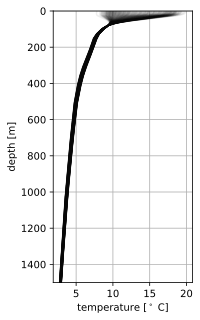

In [398]:
fig = plt.figure(figsize=(2.5,5))
for k in range(T1_profs.shape[0]):
    plt.plot(T1_profs[k,:], np.arange(1500), c='k', alpha=0.07)
    
plt.ylim([1500,0])
plt.grid()
plt.xlabel('temperature [$^\circ$ C]')
plt.ylabel('depth [m]')

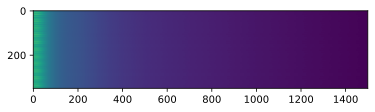

In [399]:
plt.imshow(T1_profs.T, aspect='auto', )

## Build sound speed profiles

In [2]:
fn = '/datadrive/HYCOM_data/Axial_Seamount_earthengine/*.nc'
HYCOM = xr.open_mfdataset(fn).sel({'depth':slice(0,1500)}).dropna('time')

HYCOM = HYCOM.interp({'depth':np.arange(0,1500)}, method='cubic')

### Do a little work to find N
- I'm going to run with 512, but this would be nice to figure out for sure

In [87]:
fn = '/datadrive/simulation/caldera_sensitivity_HYCOM.nc'
pts_hycom = xr.open_dataarray(fn).rename({'time':'delay'})
ats_hycom = inversion.calculate_arrival_times(pts_hycom, dim='delay', peaks = {'s1b0':slice(2.5,3.5)})['s1b0']

In [101]:
RE = 1-ats_hycom.std()/np.sqrt(512)/ats_hycom.mean()

In [97]:
N95 = (ats_hycom.std()/(95 * ats_hycom.mean()))**2

### HYCOM PCA

In [3]:
avg_temp = HYCOM.temperature.mean('depth')
avg_sal = HYCOM.salinity.mean('depth')

temp_pca = PCA(n_components=3).fit(HYCOM.temperature - avg_temp)
sal_pca = PCA(n_components=3).fit(HYCOM.salinity - avg_sal)

In [4]:
T_coefs = np.concatenate((np.expand_dims(avg_temp,1), temp_pca.transform(HYCOM['temperature'])), axis=1)
S_coefs = np.concatenate((np.expand_dims(avg_sal,1), sal_pca.transform(HYCOM['salinity'])), axis=1)

temp_comps = temp_pca.components_
sal_comps = sal_pca.components_

### fit distribution for all 8 coefficents

In [5]:
# fit distributions to T and S coefficients
# manually set bandwidth for S0, because it is such a small range
Tkernels = []
Skernels = []
Tbounds = []
Sbounds = []

for k in range(4):
    Tkernels.append(stats.gaussian_kde(T_coefs[:,k]))
    if k == 0:
        Skernels.append(stats.gaussian_kde(S_coefs[:,k], bw_method=0.02))
    else:
        Skernels.append(stats.gaussian_kde(S_coefs[:,k]))
        
    Tbounds.append([np.mean(T_coefs[:,k]) - 3*np.std(T_coefs[:,k]), np.mean(T_coefs[:,k]) + 3*np.std(T_coefs[:,k])])
    Sbounds.append([np.mean(S_coefs[:,k]) - 3*np.std(S_coefs[:,k]), np.mean(S_coefs[:,k]) + 3*np.std(S_coefs[:,k])])

### create 200 samples of each coefficient

#### hand tune std factor
- decides the range of values to sample

-1.6058638974218247
1.6058638975088235


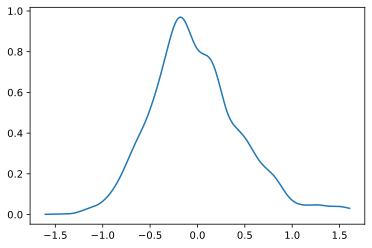

In [180]:
factor = 3
k = 3

low_bound = np.mean(S_coefs[:,k]) - factor*np.std(S_coefs[:,k])
high_bound = np.mean(S_coefs[:,k]) + factor*np.std(S_coefs[:,k])

print(low_bound)
print(high_bound)

x = np.linspace(low_bound, high_bound, 1000)
plt.plot(x, Skernels[k](x))

#### create samples

In [6]:
def inverse_transform(samples, kernel, x):
    '''
    inverse_transform. Given target pdf and samples, transform samples into distribution of pdf
    
    Parameters
    ----------
    samples : array like
        quasi random samples generated by Sobol or other related method
    kernel : scipy.stats._kde.gaussian_kde
        estimated kernel from data
    x : array like
        bin values for kernel
        
    '''
    # Calculate the cumulative distribution function (CDF) from the PDF
    cdf = np.cumsum(kernel(x))
    
    # Normalize the CDF
    cdf /= cdf[-1]
    
    # Inverse transform the uniform samples to the estimated distribution
    transformed_samples = np.interp(samples, cdf, x)
    
    return transformed_samples

In [7]:
Tsamples = []
Ssamples = []
N = 512

for k in range(4):

    #samples = stats.qmc.Sobol(1).random(N)
    samples = np.random.rand(N)
    x = np.linspace(Tbounds[k][0], Tbounds[k][1], N)
    Tsamples.append(inverse_transform(samples, Tkernels[k], x))
    Tsamples[k] = np.expand_dims(Tsamples[k], 1)
    
    #samples = stats.qmc.Sobol(1).random(N)
    samples = np.random.rand(N)
    x = np.linspace(Sbounds[k][0], Sbounds[k][1], N)
    Ssamples.append(inverse_transform(samples, Skernels[k], x))
    Ssamples[k] = np.expand_dims(Ssamples[k], 1)

##### check distributions of resampled coefficents

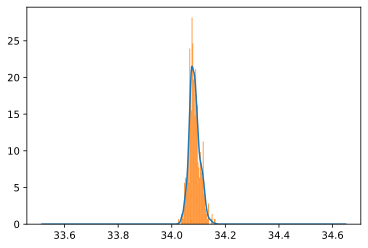

In [10]:
k = 0

x = np.linspace(Sbounds[k][0], Sbounds[k][1], N)
plt.plot(x, Skernels[k](x))
_ = plt.hist(Ssamples[k], bins=50, density=True)

## construct SSPs from single coefficient draws

### create individual temperature and salinity profiles

In [11]:
x = np.linspace(Tbounds[0][0], Tbounds[0][1], 1000)
T_mean = np.trapz(x * Tkernels[0](x), x)
x = np.linspace(Sbounds[0][0], Sbounds[0][1], 1000)
S_mean = np.trapz(x * Skernels[0](x), x)

Tprofs = []
Sprofs = []

Tblank = np.ones(1500)*T_mean
Sblank = np.ones(1500)*S_mean

for k in range(4):
    if k == 0:
        Tprofs.append(Tsamples[k] @ np.ones((1,1500)))
        Sprofs.append(Ssamples[k] @ np.ones((1,1500)))
    
    else:
        T_sampled_coefs = np.hstack((np.zeros((N,k-1)), Tsamples[k], np.zeros((N,2-k+1))))
        Tprofs.append((T_sampled_coefs @ temp_comps) + temp_pca.mean_ + T_mean)
        
        S_sampled_coefs = np.hstack((np.zeros((N,k-1)), Ssamples[k], np.zeros((N,2-k+1))))
        Sprofs.append((S_sampled_coefs @ sal_comps) + sal_pca.mean_ + S_mean)

#### check profiles to make sure they make sense

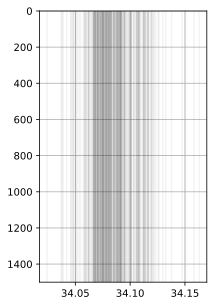

In [13]:
k = 0
fig = plt.figure(figsize=(3,5))
for i in range(256):

    plt.plot(Sprofs[k][i,:],np.arange(1500), c='k', alpha=0.05)
    
plt.ylim([1500,0])
plt.grid()

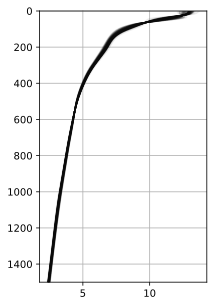

In [17]:
k = 3
fig = plt.figure(figsize=(3,5))
for i in range(256):

    plt.plot(Tprofs[k][i,:],np.arange(1500), c='k', alpha=0.05)
    
plt.ylim([1500,0])
plt.grid()

### create sound speed profiles

In [18]:
# Temperature coefficient ssps
for k in range(4):
    if k == 0:
        ssps = sw.soundspeed(Sblank, Tprofs[k], np.arange(1500))
    else:
        ssps = np.concatenate((ssps, sw.soundspeed(Sblank, Tprofs[k], np.arange(1500))), axis=0)
        
# Salinity coefficient ssps
for k in range(4):
    ssps = np.concatenate((ssps, sw.soundspeed(Sprofs[k], Tblank, np.arange(1500))), axis=0)

In [19]:
ssps.shape

(4096, 1500)

In [20]:
fig, axes = plt.subplots(2,4, figsize=(10,6))
axes = axes.flatten()

for m in range(8):
    plt.sca(axes[m])
    for k in range(N*m,N*(m+1)):
        
        plt.plot(ssps[k,:], np.arange(0,1500), c='k', alpha=0.01)
    plt.ylim([1500,0])
    plt.grid()
    plt.ylabel('depth [m]')
    plt.xlabel('c [m/s]')

    if m < 4:
        plt.title(f'$T_{m}$')
    if m >= 4:
        plt.title(f'$S_{m-4}$')
        
plt.tight_layout()
#fig.savefig('figures/sampled_profiles.svg')

In [21]:
fn = 'sampled_ssps_uniform_512.pkl'

with open(fn, 'wb') as f:
    pickle.dump(ssps, f)

## Analyze Results
simulation run in simulation/sensitivity_analysis.py

In [2]:
fn = '/datadrive/simulation/caldera_sensitivity.pkl'
with open(fn, 'rb') as f:
    pts = pickle.load(f)

In [ ]:
fn = '/datadrive/simulation/caldera_sensitivity_HYCOM.nc'
pts_hycom = xr.open_dataarray(fn).rename({'time':'delay'})

In [ ]:
ptx = xr.DataArray(np.array(pts), dims=['parameter','delay'], coords = ({'delay':np.arange(0,30,0.005)}), name='sensitivity pt')

In [ ]:
ats_sens = inversion.calculate_arrival_times(ptx, dim='delay', peaks = {'s1b0':slice(2.5,3.5)})['s1b0']
ats_hycom = inversion.calculate_arrival_times(pts_hycom, dim='delay', peaks = {'s1b0':slice(2.5,3.5)})['s1b0']

In [78]:
ats_hycom_slice = ats_hycom.loc[pd.Timestamp('2016-01-01'):]

(2.95, 2.97)

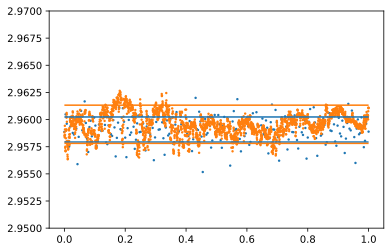

In [79]:
k=0

plt.scatter(np.linspace(0,1,256), ats_sens[k*256:(k+1)*256], lw=0, s=6)
plt.hlines(np.mean(ats_sens[k*256:(k+1)*256]) + np.std(ats_sens[k*256:(k+1)*256]), 0, 1)
plt.hlines(np.mean(ats_sens[k*256:(k+1)*256]) - np.std(ats_sens[k*256:(k+1)*256]), 0, 1)

plt.scatter(np.linspace(0,1,len(ats_hycom_slice)), ats_hycom_slice, lw=0, s=6)
plt.hlines(np.mean(ats_hycom_slice) + np.std(ats_hycom_slice), 0, 1, color='C1')
plt.hlines(np.mean(ats_hycom_slice) - np.std(ats_hycom_slice), 0, 1, color='C1')
plt.ylim([2.95, 2.97])

In [86]:
ats_sens.std()

<xarray.DataArray 's1b0' ()>
array(0.00045677)

In [85]:
ats_hycom_slice.std()

<xarray.DataArray 's1b0' ()>
array(0.00176142)

In [80]:
T0_pdf = scipy.stats.gaussian_kde(ats_sens[:256])
HYCOM_pdf = scipy.stats.gaussian_kde(ats_hycom_slice)

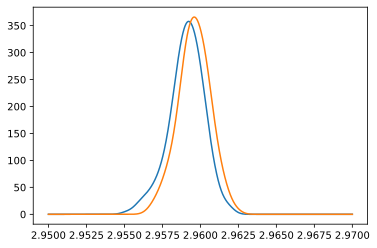

In [81]:
x = np.linspace(2.95, 2.97, 1000)
plt.plot(x, T0_pdf(x))
plt.plot(x, HYCOM_pdf(x))

(2.95, 2.97)

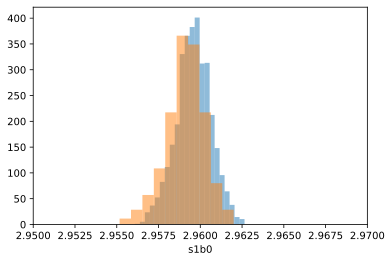

In [84]:
_ = ats_hycom_slice.plot.hist(bins=250, alpha=0.5, density=True)
_ = (ats_sens[:256]).plot.hist(alpha=0.5, density=True)

plt.xlim([2.95, 2.97])
#plt.vlines(ats_sens[:256].mean() - ats_sens[:256].std()/2, 0, 90, color='k')
#plt.vlines(ats_sens[:256].mean() + ats_sens[:256].std()/2, 0, 90, color='k')

#plt.vlines(ats.mean() - ats.std()/2, 0, 90, color='k')
#plt.vlines(ats.mean() + ats.std()/2, 0, 90, color='k')

In [69]:
explained_var = []

for k in range(8):
    explained_var.append(float(np.var(ats_sens[k*256:(k+1)*256])))#/np.var(ats_hycom.loc[pd.Timestamp('2016-01-01'):])))
explained_var = np.array(explained_var)

In [70]:
for k in range(8):
    print(explained_var[k] * 100)

0.00013276914287975808
1.9303302986440296e-06
1.1799169712621821e-07
8.57541771490865e-09
2.3783774054991843e-07
5.1815420518889284e-12
6.857412768148786e-13
6.99836741383847e-13


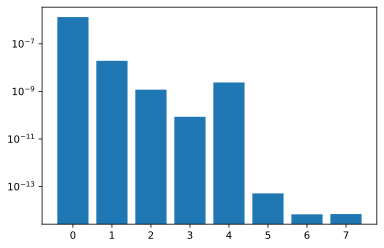

In [77]:
plt.bar(np.arange(8), explained_var)
plt.yscale('log')